### Imports

In [32]:
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt 
%matplotlib inline
import torch
import warnings
warnings.filterwarnings('ignore')

In [33]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


### Data Dictionary 

In [34]:
data_dict = pd.read_csv("/kaggle/input/datasets/sergionefedov/marriage-longevity-what-makes-relationships-last/data_dictionary.csv")
data_dict

,column,type,description
0,marriage_id,string,Unique marriage id
1,marriage_number,int,"1st, 2nd or 3rd marriage — one of the stronges..."
2,age_at_marriage,int,Age at the start of this marriage
3,age_gap_years,int,Age difference between partners
4,education_level,string,less_than_hs / high_school / some_college / ba...
5,household_income_usd,float,Household income (USD)
6,financial_stress,float,Self-reported financial stress (0-10)
7,both_employed,int,1 if both partners employed
8,cohabited_before,int,1 if the couple cohabited before marrying
9,premarital_counseling,int,1 if they did premarital counselling — a prote...


### Dataset

In [35]:
df = pd.read_csv("/kaggle/input/datasets/sergionefedov/marriage-longevity-what-makes-relationships-last/marriage_longevity_master.csv")
df

,marriage_id,marriage_number,age_at_marriage,age_gap_years,education_level,household_income_usd,financial_stress,both_employed,cohabited_before,premarital_counseling,...,contempt,defensiveness,stonewalling,repair_attempt_success,positive_negative_ratio,conflict_frequency_weekly,shared_activities_weekly,years_married,years_to_divorce,divorced
0,MAR000000,1,36,6,less_than_hs,68600.0,5.9,1,1,0,...,7.7,5.8,8.1,4.1,2.22,3.0,4.0,22.0,NaN,0
1,MAR000001,2,59,1,some_college,328800.0,0.0,1,1,0,...,1.7,6.8,3.0,5.1,11.99,1.0,1.0,15.5,NaN,0
2,MAR000002,2,44,1,high_school,139900.0,6.1,0,0,1,...,6.5,4.2,4.8,5.7,2.27,4.0,2.0,7.2,NaN,0
3,MAR000003,1,25,2,bachelors,97600.0,5.9,1,1,1,...,0.0,4.1,0.9,8.7,6.24,0.0,4.0,13.5,NaN,0
4,MAR000004,2,29,3,graduate,98200.0,4.0,0,0,1,...,4.4,4.6,9.6,8.9,2.59,4.0,5.0,7.5,7.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44995,MAR044995,2,45,3,high_school,145300.0,7.0,1,1,0,...,8.5,7.1,2.1,6.4,3.16,2.0,3.0,1.8,NaN,0
44996,MAR044996,1,33,0,some_college,95600.0,8.9,0,1,0,...,3.9,5.0,8.1,6.7,1.96,4.0,0.0,2.2,NaN,0
44997,MAR044997,1,33,3,some_college,91200.0,4.9,1,0,0,...,1.4,1.5,6.5,7.0,2.33,5.0,0.0,7.8,7.8,1
44998,MAR044998,1,30,5,some_college,21300.0,9.5,0,1,1,...,7.6,4.7,9.1,1.5,4.95,1.0,5.0,9.1,9.1,1


### Different datatypes of different columns

In [36]:
df.dtypes

marriage_id                   object
marriage_number                int64
age_at_marriage                int64
age_gap_years                  int64
education_level               object
household_income_usd         float64
financial_stress             float64
both_employed                  int64
cohabited_before               int64
premarital_counseling          int64
child_before_marriage          int64
n_children                     int64
religious_attendance          object
criticism                    float64
contempt                     float64
defensiveness                float64
stonewalling                 float64
repair_attempt_success       float64
positive_negative_ratio      float64
conflict_frequency_weekly    float64
shared_activities_weekly     float64
years_married                float64
years_to_divorce             float64
divorced                       int64
dtype: object

In [37]:
df.select_dtypes('object').columns

Index(['marriage_id', 'education_level', 'religious_attendance'], dtype='object')

In [38]:
df.select_dtypes('float64').columns

Index(['household_income_usd', 'financial_stress', 'criticism', 'contempt',
       'defensiveness', 'stonewalling', 'repair_attempt_success',
       'positive_negative_ratio', 'conflict_frequency_weekly',
       'shared_activities_weekly', 'years_married', 'years_to_divorce'],
      dtype='object')

In [39]:
df.select_dtypes('int').columns

Index(['marriage_number', 'age_at_marriage', 'age_gap_years', 'both_employed',
       'cohabited_before', 'premarital_counseling', 'child_before_marriage',
       'n_children', 'divorced'],
      dtype='object')

### Summary stats and nan checking

In [40]:
missing_pct = (df.isnull().sum() / len(df)) * 100
print(missing_pct[missing_pct > 0])

years_to_divorce    53.982222
dtype: float64


#### There is noly one column 'years_to_divorce' haviing the nan valus but it is also seen in the DATA_DICT that it is occasional. Hence, ignopring it and continue

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45000 entries, 0 to 44999
Data columns (total 24 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   marriage_id                45000 non-null  object 
 1   marriage_number            45000 non-null  int64  
 2   age_at_marriage            45000 non-null  int64  
 3   age_gap_years              45000 non-null  int64  
 4   education_level            45000 non-null  object 
 5   household_income_usd       45000 non-null  float64
 6   financial_stress           45000 non-null  float64
 7   both_employed              45000 non-null  int64  
 8   cohabited_before           45000 non-null  int64  
 9   premarital_counseling      45000 non-null  int64  
 10  child_before_marriage      45000 non-null  int64  
 11  n_children                 45000 non-null  int64  
 12  religious_attendance       45000 non-null  object 
 13  criticism                  45000 non-null  flo

In [42]:
df.describe()

,marriage_number,age_at_marriage,age_gap_years,household_income_usd,financial_stress,both_employed,cohabited_before,premarital_counseling,child_before_marriage,n_children,...,contempt,defensiveness,stonewalling,repair_attempt_success,positive_negative_ratio,conflict_frequency_weekly,shared_activities_weekly,years_married,years_to_divorce,divorced
count,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,...,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,45000.000000,20708.000000,45000.000000
mean,1.302244,30.168644,2.868156,118024.922222,5.186407,0.658667,0.618178,0.243822,0.189644,1.404733,...,3.256393,4.760267,3.801571,5.628598,4.011752,2.378267,3.035089,10.699487,7.721021,0.460178
std,0.560842,7.588164,2.205134,83738.454555,2.357498,0.474162,0.485839,0.429391,0.392024,1.183376,...,2.181556,2.154957,2.169450,2.284411,2.852853,1.656582,1.920517,7.820057,4.848361,0.498417
min,1.000000,16.000000,0.000000,9000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.500000,0.500000,0.000000
25%,1.000000,25.000000,1.000000,61800.000000,3.600000,0.000000,0.000000,0.000000,0.000000,1.000000,...,1.600000,3.300000,2.200000,4.000000,2.080000,1.000000,2.000000,5.100000,4.200000,0.000000
50%,1.000000,29.000000,2.000000,95700.000000,5.200000,1.000000,1.000000,0.000000,0.000000,1.000000,...,3.200000,4.800000,3.800000,5.700000,3.260000,2.000000,3.000000,8.700000,6.700000,0.000000
75%,2.000000,34.000000,4.000000,148400.000000,6.800000,1.000000,1.000000,0.000000,0.000000,2.000000,...,4.800000,6.200000,5.300000,7.300000,5.060000,3.000000,4.000000,14.000000,10.200000,1.000000
max,3.000000,68.000000,16.000000,600000.000000,10.000000,1.000000,1.000000,1.000000,1.000000,6.000000,...,10.000000,10.000000,10.000000,10.000000,20.000000,12.000000,15.000000,55.000000,45.000000,1.000000


In [43]:
df.shape

(45000, 24)

### Dropping columns

In [44]:
# Droping marriage_id as it is a identical and unique id for every entry
df.drop(columns = 'marriage_id' ,inplace = True)

In [45]:
# Dropping years_to_divorce and years_married (direct target leakage variables) to isolate features known prior to outcome determination.
df.drop(columns = ['years_to_divorce','years_married'],inplace = True)

In [46]:
df.head()

,marriage_number,age_at_marriage,age_gap_years,education_level,household_income_usd,financial_stress,both_employed,cohabited_before,premarital_counseling,child_before_marriage,...,religious_attendance,criticism,contempt,defensiveness,stonewalling,repair_attempt_success,positive_negative_ratio,conflict_frequency_weekly,shared_activities_weekly,divorced
0,1,36,6,less_than_hs,68600.0,5.9,1,1,0,0,...,never,4.8,7.7,5.8,8.1,4.1,2.22,3.0,4.0,0
1,2,59,1,some_college,328800.0,0.0,1,1,0,0,...,never,0.2,1.7,6.8,3.0,5.1,11.99,1.0,1.0,0
2,2,44,1,high_school,139900.0,6.1,0,0,1,0,...,never,5.2,6.5,4.2,4.8,5.7,2.27,4.0,2.0,0
3,1,25,2,bachelors,97600.0,5.9,1,1,1,0,...,rarely,3.7,0.0,4.1,0.9,8.7,6.24,0.0,4.0,0
4,2,29,3,graduate,98200.0,4.0,0,0,1,0,...,rarely,5.4,4.4,4.6,9.6,8.9,2.59,4.0,5.0,1


### Columns Optimization

In [47]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder

In [48]:
print(df['education_level'].unique())
print(df['religious_attendance'].unique())

['less_than_hs' 'some_college' 'high_school' 'bachelors' 'graduate']
['never' 'rarely' 'monthly' 'weekly']


In [49]:
nominal = ['education_level', 'religious_attendance']

edu_order = ['less_than_hs', 'some_college', 'high_school', 'bachelors', 'graduate']
religious_order = ['never', 'rarely', 'monthly', 'weekly']

In [50]:
preprosses = ColumnTransformer(
    transformers = [
        (
            'ordinal encoding',
            OrdinalEncoder(categories = [edu_order, religious_order]),
            nominal
        )
    ], remainder='passthrough'
)

In [51]:
transformed_array = preprosses.fit_transform(df)
column_names = preprosses.get_feature_names_out()

In [52]:
df = pd.DataFrame(transformed_array, columns=column_names)
df.head()

,ordinal encoding__education_level,ordinal encoding__religious_attendance,remainder__marriage_number,remainder__age_at_marriage,remainder__age_gap_years,remainder__household_income_usd,remainder__financial_stress,remainder__both_employed,remainder__cohabited_before,remainder__premarital_counseling,...,remainder__n_children,remainder__criticism,remainder__contempt,remainder__defensiveness,remainder__stonewalling,remainder__repair_attempt_success,remainder__positive_negative_ratio,remainder__conflict_frequency_weekly,remainder__shared_activities_weekly,remainder__divorced
0,0.0,0.0,1.0,36.0,6.0,68600.0,5.9,1.0,1.0,0.0,...,2.0,4.8,7.7,5.8,8.1,4.1,2.22,3.0,4.0,0.0
1,1.0,0.0,2.0,59.0,1.0,328800.0,0.0,1.0,1.0,0.0,...,3.0,0.2,1.7,6.8,3.0,5.1,11.99,1.0,1.0,0.0
2,2.0,0.0,2.0,44.0,1.0,139900.0,6.1,0.0,0.0,1.0,...,1.0,5.2,6.5,4.2,4.8,5.7,2.27,4.0,2.0,0.0
3,3.0,1.0,1.0,25.0,2.0,97600.0,5.9,1.0,1.0,1.0,...,2.0,3.7,0.0,4.1,0.9,8.7,6.24,0.0,4.0,0.0
4,4.0,1.0,2.0,29.0,3.0,98200.0,4.0,0.0,0.0,1.0,...,2.0,5.4,4.4,4.6,9.6,8.9,2.59,4.0,5.0,1.0


In [53]:
clean_column_names = [
    'education_level', 'religious_attendance', 'marriage_number',
    'age_at_marriage', 'age_gap_years', 'household_income_usd', 
    'financial_stress', 'both_employed', 'cohabited_before',
    'premarital_counseling', 'child_before_marriage', 'n_children', 
    'criticism', 'contempt', 'defensiveness', 'stonewalling',
    'repair_attempt_success', 'positive_negative_ratio',
    'conflict_frequency_weekly', 'shared_activities_weekly', 'divorced'
]
df.columns = clean_column_names
df.head()

,education_level,religious_attendance,marriage_number,age_at_marriage,age_gap_years,household_income_usd,financial_stress,both_employed,cohabited_before,premarital_counseling,...,n_children,criticism,contempt,defensiveness,stonewalling,repair_attempt_success,positive_negative_ratio,conflict_frequency_weekly,shared_activities_weekly,divorced
0,0.0,0.0,1.0,36.0,6.0,68600.0,5.9,1.0,1.0,0.0,...,2.0,4.8,7.7,5.8,8.1,4.1,2.22,3.0,4.0,0.0
1,1.0,0.0,2.0,59.0,1.0,328800.0,0.0,1.0,1.0,0.0,...,3.0,0.2,1.7,6.8,3.0,5.1,11.99,1.0,1.0,0.0
2,2.0,0.0,2.0,44.0,1.0,139900.0,6.1,0.0,0.0,1.0,...,1.0,5.2,6.5,4.2,4.8,5.7,2.27,4.0,2.0,0.0
3,3.0,1.0,1.0,25.0,2.0,97600.0,5.9,1.0,1.0,1.0,...,2.0,3.7,0.0,4.1,0.9,8.7,6.24,0.0,4.0,0.0
4,4.0,1.0,2.0,29.0,3.0,98200.0,4.0,0.0,0.0,1.0,...,2.0,5.4,4.4,4.6,9.6,8.9,2.59,4.0,5.0,1.0


### Visualizations

#### Divorced v/s Not divorced

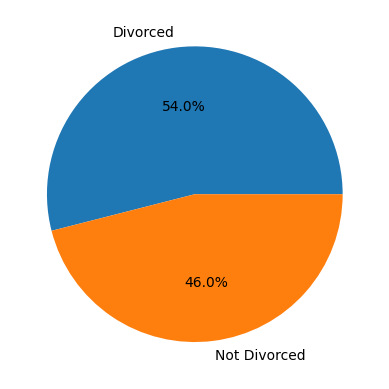

In [54]:
plt.pie(df['divorced'].value_counts().values,labels = ['Divorced','Not Divorced'],autopct = "%1.1f%%");

#### Education Level

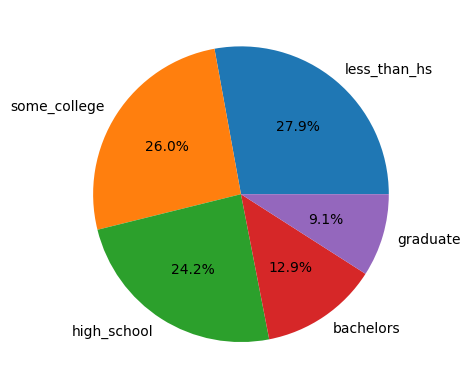

In [55]:
plt.pie(df['education_level'].value_counts().values,autopct = "%1.1f%%",labels = edu_order);

#### Religious activity

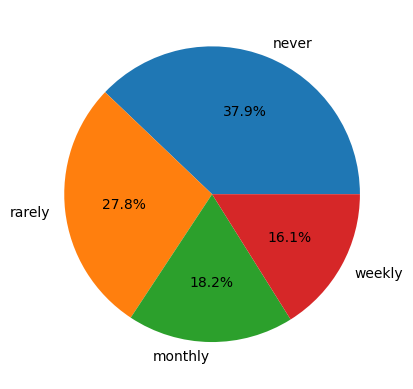

In [56]:
plt.pie(df['religious_attendance'].value_counts().values,autopct="%1.1f%%",labels = religious_order);

### Dataframe insights

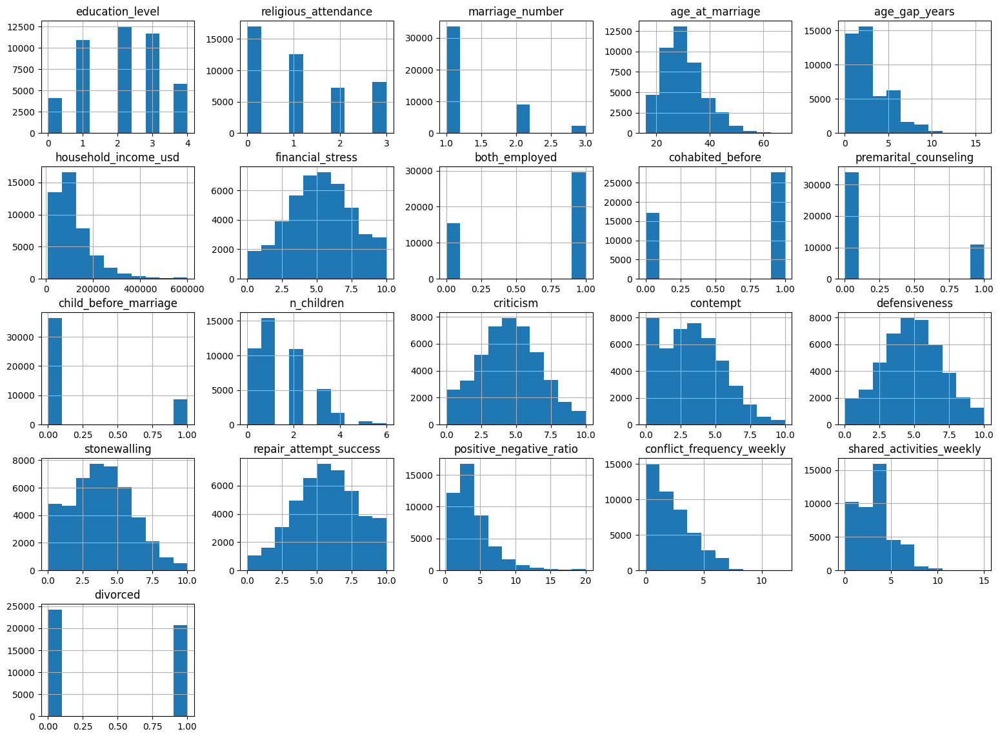

In [57]:
df.hist(figsize = (19,14))
plt.show()

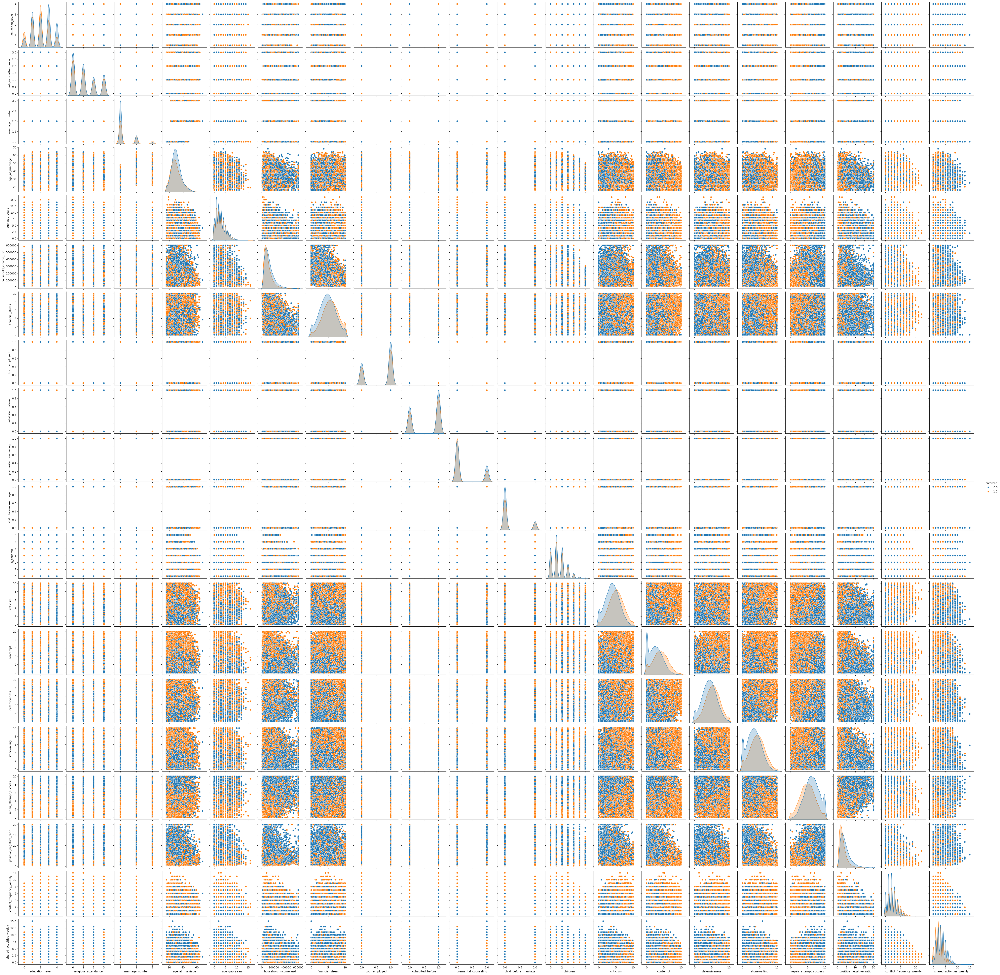

In [58]:
sns.pairplot(df,hue='divorced')

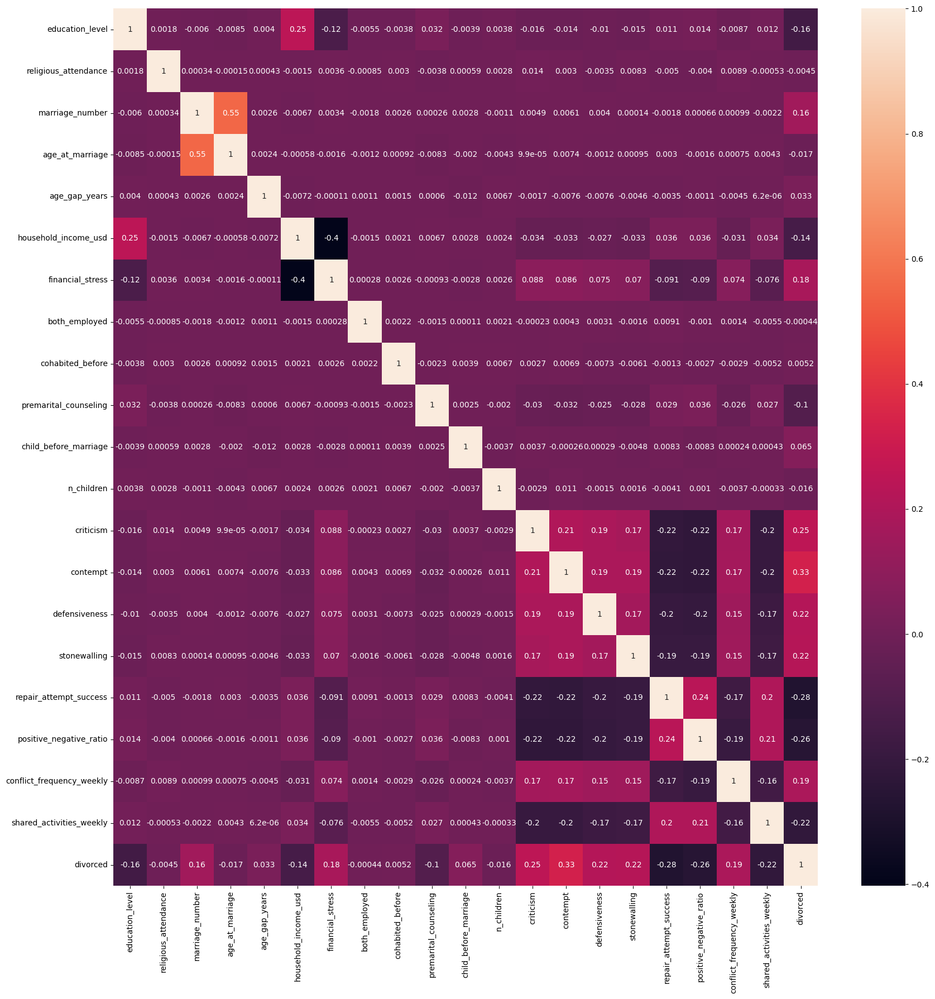

In [59]:
plt.figure(figsize=(18,18))
sns.heatmap(df.corr(),annot=True)
plt.tight_layout()

In [60]:
# sns.displot(df)

### Standard scaling

In [61]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()

In [62]:
from sklearn.model_selection import train_test_split

x = df.iloc[:,:-1]
y = df.iloc[:, -1]
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20 , random_state=42,shuffle=True)

In [63]:
scaled_x_train=ss.fit_transform(x_train)

scaled_x_train

array([[-0.07840099, -0.13269259, -0.53767777, ..., -0.06252453,
         0.97717619, -0.53799005],
       [-0.93213226,  0.76320636, -0.53767777, ..., -0.47633594,
        -0.83477059, -1.06115703],
       [-0.07840099, -1.02859154, -0.53767777, ..., -0.13679837,
        -0.83477059, -1.06115703],
       ...,
       [-0.93213226, -1.02859154, -0.53767777, ..., -0.72745226,
         0.97717619, -0.01482306],
       [ 0.77533028, -0.13269259, -0.53767777, ..., -0.17924057,
         0.37319393,  1.0315109 ],
       [ 1.62906156,  1.65910532, -0.53767777, ...,  0.13553905,
        -0.23078833,  1.0315109 ]])

In [64]:
scaled_x_test=ss.transform(x_test)

scaled_x_test

array([[ 0.77533028, -0.13269259,  1.2539179 , ...,  0.81461419,
         0.37319393,  1.0315109 ],
       [ 1.62906156, -1.02859154, -0.53767777, ..., -0.74513651,
         0.97717619,  0.50834392],
       [ 1.62906156, -1.02859154, -0.53767777, ..., -0.53292553,
        -1.43875285, -1.06115703],
       ...,
       [ 0.77533028, -1.02859154, -0.53767777, ..., -0.22521961,
        -0.83477059, -0.01482306],
       [-0.93213226, -0.13269259, -0.53767777, ...,  1.91811128,
        -0.83477059, -1.06115703],
       [-0.07840099,  0.76320636, -0.53767777, ...,  1.1859834 ,
        -0.83477059, -0.01482306]])

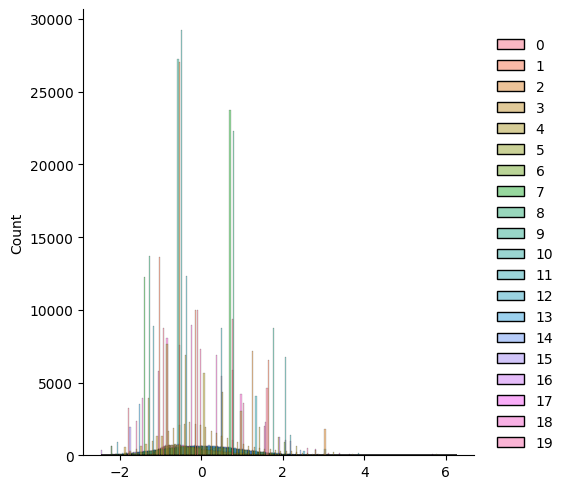

In [65]:
sns.displot(scaled_x_train)

### Model Training

In [66]:
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

In [67]:
svm = SVC()

svm.fit(scaled_x_train,y_train)

SVC()

In [68]:
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
xg = XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)

In [69]:
dt.fit(scaled_x_train, y_train)

DecisionTreeClassifier()

In [70]:
rf.fit(scaled_x_train, y_train)

RandomForestClassifier()

In [71]:
xg.fit(scaled_x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, ...)

### Model Testing

In [72]:
print("SVM Training: ",svm.score(scaled_x_train,y_train))
print("SVM Testing: ",svm.score(scaled_x_test,y_test))

SVM Training:  0.7814166666666666
SVM Testing:  0.744


In [73]:
print("Decision Tree Training: ",dt.score(scaled_x_train,y_train))
print("Decision Tree Testing: ",dt.score(scaled_x_test,y_test))

Decision Tree Training:  1.0
Decision Tree Testing:  0.6313333333333333


In [74]:
print("Random Forest Training: ",rf.score(scaled_x_train,y_train))
print("Random Forest Testing: ",rf.score(scaled_x_test,y_test))

Random Forest Training:  1.0
Random Forest Testing:  0.7391111111111112


In [75]:
print("XgBoost Classifier Training: ",xg.score(scaled_x_train,y_train))
print("XgBoost Classifier Testing: ",xg.score(scaled_x_test,y_test))

XgBoost Classifier Training:  0.7608888888888888
XgBoost Classifier Testing:  0.749


### Results

In [83]:
y_pred = xg.predict(scaled_x_test)

In [84]:
y_pred1 = svm.predict(scaled_x_test)

In [85]:
from sklearn.metrics import classification_report 
report = classification_report(y_test, y_pred, output_dict = True)

In [86]:
report1 = classification_report(y_test, y_pred1, output_dict = True)

In [87]:
df.head()

,education_level,religious_attendance,marriage_number,age_at_marriage,age_gap_years,household_income_usd,financial_stress,both_employed,cohabited_before,premarital_counseling,...,n_children,criticism,contempt,defensiveness,stonewalling,repair_attempt_success,positive_negative_ratio,conflict_frequency_weekly,shared_activities_weekly,divorced
0,0.0,0.0,1.0,36.0,6.0,68600.0,5.9,1.0,1.0,0.0,...,2.0,4.8,7.7,5.8,8.1,4.1,2.22,3.0,4.0,0.0
1,1.0,0.0,2.0,59.0,1.0,328800.0,0.0,1.0,1.0,0.0,...,3.0,0.2,1.7,6.8,3.0,5.1,11.99,1.0,1.0,0.0
2,2.0,0.0,2.0,44.0,1.0,139900.0,6.1,0.0,0.0,1.0,...,1.0,5.2,6.5,4.2,4.8,5.7,2.27,4.0,2.0,0.0
3,3.0,1.0,1.0,25.0,2.0,97600.0,5.9,1.0,1.0,1.0,...,2.0,3.7,0.0,4.1,0.9,8.7,6.24,0.0,4.0,0.0
4,4.0,1.0,2.0,29.0,3.0,98200.0,4.0,0.0,0.0,1.0,...,2.0,5.4,4.4,4.6,9.6,8.9,2.59,4.0,5.0,1.0


In [81]:
pd.DataFrame(report).T 

,precision,recall,f1-score,support
0.0,0.755122,0.794009,0.774077,4874.000
1.0,0.740903,0.695831,0.717660,4126.000
accuracy,0.749000,0.749000,0.749000,0.749
macro avg,0.748013,0.744920,0.745869,9000.000
weighted avg,0.748603,0.749000,0.748213,9000.000


In [82]:
pd.DataFrame(report1).T 

,precision,recall,f1-score,support
0.0,0.751369,0.788059,0.769277,4874.000
1.0,0.734311,0.691953,0.712503,4126.000
accuracy,0.744000,0.744000,0.744000,0.744
macro avg,0.742840,0.740006,0.740890,9000.000
weighted avg,0.743549,0.744000,0.743249,9000.000


### If you like my work, Do Upvote and Thankyouu for reading this notebook